In [1]:
from main import *
from useful_functions import *
from visualization import *

%matplotlib inline
plt.rcParams['font.size'] = 6

# Setting paths

In [4]:
top_directory = '/media/anleg84/Backup Plus/CERVO/Data/Networks2024/'
atlas_path = '/home/anleg84/Documents/Atlas/MapzebrainOld/'

In [5]:
atlas = MapzebrainAtlas(atlas_path)
centroids = np.concatenate([atlas.regionCentroids['left'], atlas.regionCentroids['right']], axis=0)
centroids[:, 1] = 974 - centroids[:, 1]
excluded = np.load('Results/excluded_regions.npy')

centroids_ = np.delete(centroids, np.concatenate([excluded, excluded + 70]), axis=0)

# Loading figure-related data

In [6]:
FC = np.load('Results/FC_matrix.npy')
excluded = np.load('Results/excluded_regions.npy')

expression = np.load('Results/gene_expression.npy')
expression = np.delete(expression, excluded, axis=1)
expression = zscore(expression, axis=0) # Each region gets z-scored to account for spatial heterogeneity of signals (Z axis attenuation, etc)

coexpression = np.load('Results/figure7_coexpression_all.npy')
coexpression_opt = np.load('Results/figure7_coexpression_optimized.npy')

scores_per_N_1 = np.load('ComputeCanada/figure7_scores_per_N_nmi_2-14.npy')
scores_per_N_2 = np.load('ComputeCanada/figure7_scores_per_N_nmi_15.npy')
scores_per_N_3 = np.load('ComputeCanada/figure7_scores_per_N_nmi_16-29.npy')
scores_per_N_4 = np.load('ComputeCanada/figure7_scores_per_N_nmi_30-40.npy')
scores_per_N = np.concatenate([scores_per_N_1, scores_per_N_2, scores_per_N_3, scores_per_N_4], axis=0)

scores_per_N_1_null = np.load('ComputeCanada/figure7_scores_per_N_nmi_null_2-14.npy')
scores_per_N_2_null = np.load('ComputeCanada/figure7_scores_per_N_nmi_null_15.npy')
scores_per_N_3_null = np.load('ComputeCanada/figure7_scores_per_N_nmi_null_16-29.npy')
scores_per_N_4_null = np.load('ComputeCanada/figure7_scores_per_N_nmi_null_30-40.npy')
scores_per_N_null = np.concatenate([scores_per_N_1_null, scores_per_N_2_null, scores_per_N_3_null, scores_per_N_4_null], axis=0)

#scores = np.load('Results/figure7_scores_per_N.npy')
#scores_null = np.load('Results/figure7_scores_per_N_null.npy')

scores_empirical = np.load('Results/figure7_scores_12.npy')
scores_null = np.load('Results/figure7_scores_null_12.npy')

projections_top_opt = np.load('Results/figure7_optimal_genes_projections_top.npy').astype('float')
for i in range(projections_top_opt.shape[0]):
    projections_top_opt[i] = 255 * (projections_top_opt[i] / np.max(projections_top_opt[i]))
projections_side_opt = np.load('Results/figure7_optimal_genes_projections_side.npy').astype('float')
for i in range(projections_side_opt.shape[0]):
    projections_side_opt[i] = 255 * (projections_side_opt[i] / np.max(projections_side_opt[i]))

number_of_selections = np.load('Results/figure7_number_of_selections12.npy') / 1000
number_of_selections_null = np.load('Results/figure7_number_of_selections_null12.npy') / 1000

selection_probabilities = number_of_selections[np.where(number_of_selections > np.max(number_of_selections_null))]

gene_names = np.load('Genes/gene_names.npy')

Selecting visually-appealing genes

In [7]:
names = ['tbr1b', 'lhx9', 'zic1', 'otpa', 'nefma']

In [8]:
%matplotlib inline

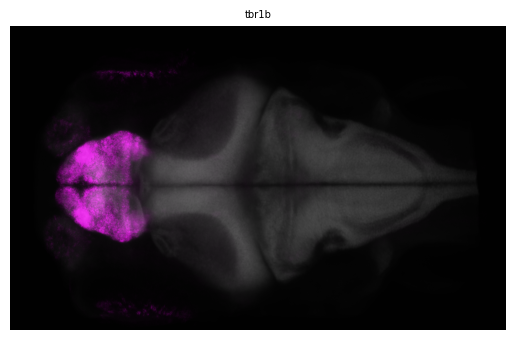

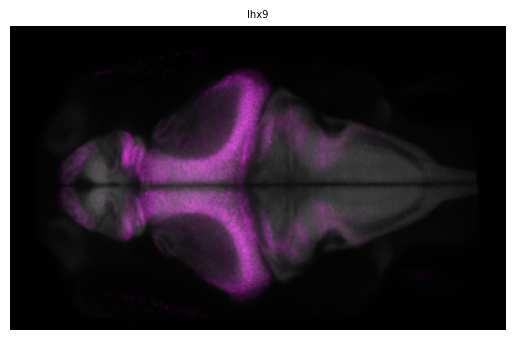

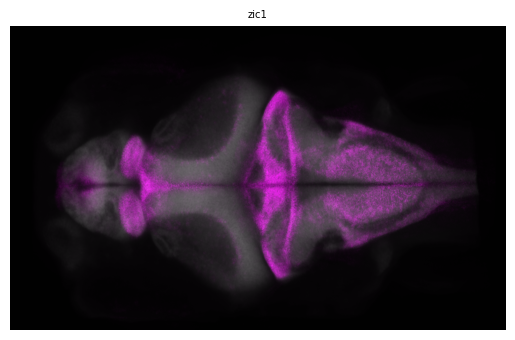

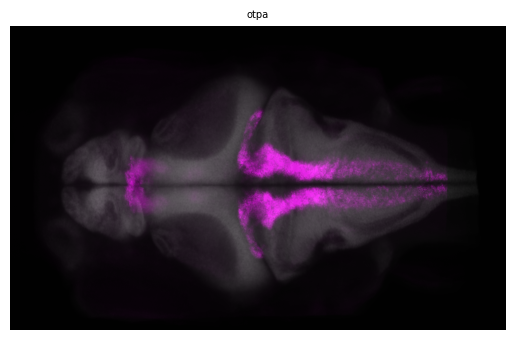

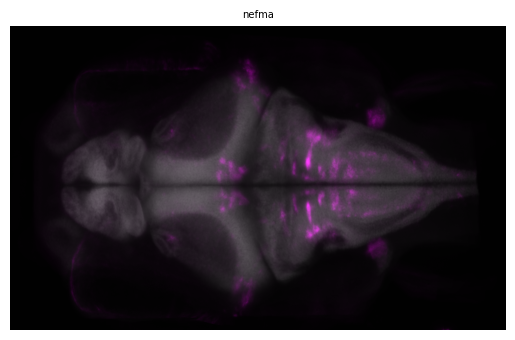

In [9]:
path = '/media/anleg84/Backup Plus/CERVO/Atlas/Mapzebrain/Gene expression/'
files = identify_files(path, ['.tif'])

projections_top = []
for name in names:
    for file in files:
        if name in file:
            stack = load_stack(path + file)
            projection_top = np.percentile(stack[::2, :, :], 95, axis=0)
            projections_top.append(projection_top)
            colors = [[0.5, 0.5, 0.5], [1, 0, 1]]
            im1 = merge([atlas.XYprojection, projection_top], colors)
            plt.imshow(np.rot90(im1))
            plt.axis('off')
            plt.title(name)
            plt.show()

In [10]:
manually_selected_ids = []
for n in names:
    id = np.where(gene_names == n)[0][0]
    manually_selected_ids.append(id)

In [11]:
mask_atlas = np.load('Results/mask_atlas.npy')

# Figure layout

In [12]:
top_filter = gaussian_filter((np.mean(mask_atlas, axis=0) > 0).astype('float'), 20)

Colormaps

In [13]:
color_genes = [43/255, 255/255, 20/255]
color_genes = [72/255, 184/255, 208/255]

cmap1 = make_cmap([[1, 1, 1], np.array(color_genes) * 0.5], [0, 1])
purple = [114/255, 0/255, 229/255]
cmap2 = make_cmap([[1, 1, 1], [0, 0, 0]], [0, 1])

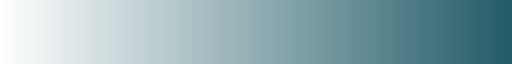

In [14]:
cmap1

HCR overlap image

In [15]:
seed = 5

colors_projection = get_colors_cmap('rainbow', len(projections_top_opt))
with temp_random_state(seed):
    np.random.shuffle(colors_projection)
    
projection_top = merge_with_pixelwise_color_contrast(projections_top_opt, colors_projection)
projection_side = merge_with_pixelwise_color_contrast(projections_side_opt, colors_projection)

for i in range(3):
    projection_top[:, :, i] = gaussian_filter(projection_top[:, :, i], 0.5)
    projection_side[:, :, i] = gaussian_filter(projection_side[:, :, i], 0.5)

Layout

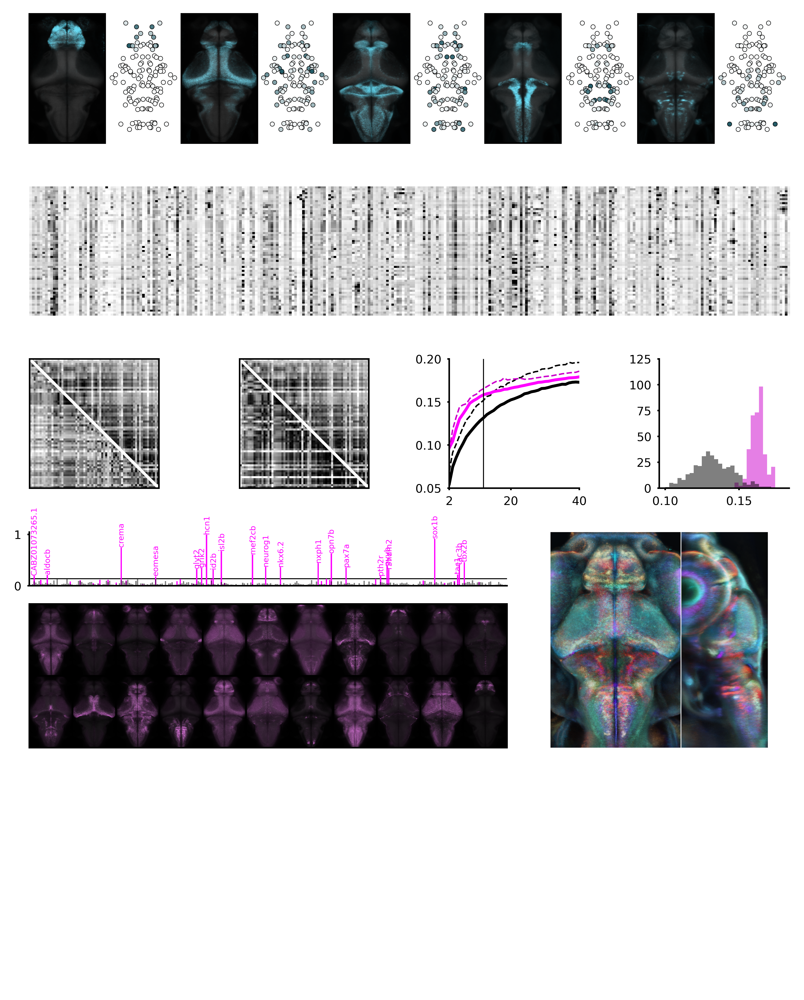

In [16]:
fig = PaperFigure(figsize=(7, 9), dpi=900)

fig.set_tick_length(1)
fig.set_font_size(6)
fig.add_background()

# Adding panels -------------------------------
x = 0.7
pad = (7 - 10 * x) / 4
h = 1.2
for i in range(5):
    fig.add_axes('gene{}'.format(i+1), (i * (2 * x + pad), 0), x, h)
    fig.add_axes('quantification{}'.format(i+1), (i * (2 * x + pad) + x, 0), x, h)
    fig.axes['gene{}'.format(i + 1)].set_xticks([])
    fig.axes['gene{}'.format(i + 1)].set_yticks([])
    fig.axes['quantification{}'.format(i + 1)].set_xticks([])
    fig.axes['quantification{}'.format(i + 1)].set_yticks([])

# Second row
y_2 = h + 0.4
fig.add_axes('expression', (0, y_2), 7, h)

# Third row
y_3 = y_2 + h + 0.4
w = h
pad = (7 - 4 * w) / 3
fig.add_axes('coex', (0, y_3), w, w)
fig.add_axes('coex_opt', (1 * (w + pad), y_3), w, w)
fig.add_axes('elbow', (2 * (w + pad), y_3), w, w)
fig.add_axes('nmi_dists', (3 * (w + pad), y_3), w, w)

# Fourth row
y_4 = y_3 + h + 0.4
fig.add_axes('selections', (0, y_4), 4.4, 0.5)
fig.add_axes('projection_top', (4.8, y_4), 2 * 0.6, 2)
fig.add_axes('projection_side', (4.8 + (2 * 0.6), y_4), 2 * 0.4, 2)

x = 4.4 / 11
y = (1 / 0.6) * x
for i in range(11):
    fig.add_axes('gene_opt{}'.format(i), (i * x, y_4 + 2 - 2 * y), x, y)
    ax = fig.axes['gene_opt{}'.format(i)]
    ax.set_xticks([])
    ax.set_yticks([])
for i in range(11):
    fig.add_axes('gene_opt{}'.format(i + 11), (i * x, y_4 + 2 - y), x, y)
    ax = fig.axes['gene_opt{}'.format(i + 11)]
    ax.set_xticks([])
    ax.set_yticks([])


#fig.add_axes('coex_opt', (size + pad, y_2 + size + pad), size, size)
#fig.add_axes('coex_opt_null', (2 * (size + pad), y_2 + size + pad), size, size)

#fig.add_axes('elbow', (3 * (size + pad), y_2), size, size)
#fig.add_axes('distributions', (3 * (size + pad), y_2 + size + pad), size, size)

#fig.add_axes('projection1', (size + pad, y_3), size * ratio, 2)
#fig.add_axes('projection2', (size + pad + ratio * size, y_3), size * (1 - ratio), 2)


# Content -------------------------------------

for i in range(5):
    ax = fig.axes['gene{}'.format(i + 1)]
    colors = [[0.25, 0.25, 0.25], color_genes]
    im = merge([atlas.XYprojection, projections_top[i]], colors)
    ax.imshow(im,  aspect='auto')
    ax.set_xlim([65, 505])
    ax.set_ylim([850, 50])

    ax = fig.axes['quantification{}'.format(i + 1)]
    ax.imshow(atlas.XYprojection,  aspect='auto', cmap='gray', alpha=0)
    values = double(expression[manually_selected_ids[i]])
    order = np.argsort(values)
    ax.scatter(centroids_[:, 0], centroids_[:, 1], c=values, cmap=cmap1,
               edgecolor='black', linewidth=0.25, s=5)
    ax.set_xlim([65, 505])
    ax.set_ylim([850, 50])
    ax.axis('off')

ax = fig.axes['expression']
ax.imshow(expression.T, cmap=cmap2, vmin=-1, vmax=4, aspect='auto')
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

ax = fig.axes['coex']
triangle = np.triu_indices(FC.shape[0], 1)
matrix = normalize(np.copy(coexpression))
matrix[triangle] = normalize(np.copy(FC))[triangle]
cax = ax.imshow(matrix, cmap=cmap2, vmin=0.15, vmax=0.95)
ax.plot([0, 64.5], [0, 64.5], color='white', linewidth=1.5)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['coex_opt']
triangle = np.triu_indices(FC.shape[0], 1)
matrix = normalize(np.copy(coexpression_opt))
matrix[triangle] = normalize(np.copy(FC))[triangle]
cax = ax.imshow(matrix, cmap=cmap2, vmin=0.15, vmax=0.95)
ax.plot([0, 64.5], [0, 64.5], color='white', linewidth=1.5)
ax.set_xticks([])
ax.set_yticks([])

ax = fig.axes['elbow']
ax.plot(np.arange(2, 41), np.mean(scores_per_N_null, axis=1), color='black')
ax.plot(np.arange(2, 41), np.percentile(scores_per_N_null, 95, axis=1), color='black', linestyle='--', linewidth=0.75)
ax.plot(np.arange(2, 41), np.mean(scores_per_N, axis=1), color=np.array([1, 0, 1]) )
ax.plot(np.arange(2, 41), np.percentile(scores_per_N, 95, axis=1), color=np.array([1, 0, 1]) * 0.8, linestyle='--', linewidth=0.75)
ax.set_xlim([2, 40])
ax.set_xticks([2, 20, 40])
ax.plot([12, 12], [0.05, 0.2], color='black', linestyle='-', linewidth=0.5)
ax.set_ylim([0.05, 0.2])
ax.spines[['top', 'right']].set_visible(False)

ax = fig.axes['nmi_dists']
bins = np.linspace(0.1, 0.18, 30)
ax.hist(scores_empirical, bins=bins, color=np.array([1, 0, 1]) * 0.8, alpha=0.5, density=True)
ax.hist(scores_null, bins=bins, alpha=0.5, color='black', density=True)
ax.spines[['top', 'right']].set_visible(False)
ax.set_ylim([0, 125])

ax = fig.axes['selections']
threshold = np.max(number_of_selections_null)
ax.plot([0, 290], [threshold, threshold], color='black', linewidth=0.5, zorder=-10)
ax.bar(np.arange(290), number_of_selections, color=[1, 0, 1])
ax.bar(np.arange(290), number_of_selections_null, color=[0, 0, 0], alpha=0.5)
selected_ids = np.where((number_of_selections) > threshold)[0]
for i in selected_ids:
    ax.text(i, number_of_selections[i] + 0.01, gene_names[i], rotation=90, ha='center', va='bottom', color=[1, 0, 1], fontsize=4)
ax.set_xlim([-1, 290])
ax.spines[['top', 'right']].set_visible(False)
ax.set_yticks([0, 1])
ax.set_xticks([])

ax = fig.axes['projection_top']
ax.imshow(projection_top, aspect='auto')
ax.set_xlim([65, 505])
ax.set_ylim([850, 50])
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

ax = fig.axes['projection_side']
ax.imshow(np.rot90(projection_side, k=-1), aspect='auto')
ax.set_xlim([50, 359])
ax.set_ylim([850, 50])
ax.set_xticks([])
ax.set_yticks([])
ax.axis('off')

for i in range(22):
    projection_id = np.flip(np.argsort(selection_probabilities))[i]
    ax = fig.axes['gene_opt{}'.format(i)]
    colors = [[0.1, 0.1, 0.1], [1, 0.5, 1]]
    im = merge([atlas.XYprojection, (projections_top_opt[projection_id] * top_filter)], colors)
    ax.imshow(im,  aspect='auto')
    ax.set_xlim([65, 505])
    ax.set_ylim([850, 50])

# Display -------------------------------------

fig.show()

In [32]:
fig.save('/home/anleg84/Documents/Figures/PaperNetworks2024/figure7_incomplete.svg')

# Manually adjusted values and colors in Inkscape and main text

Random color mapping of genes in overlay image

In [57]:
vector = np.zeros((len(colors_projection), 3))
for i, c in enumerate(colors_projection):
    vector[i] = c

In [58]:
vector = np.expand_dims(vector, axis=0)

In [59]:
%matplotlib inline

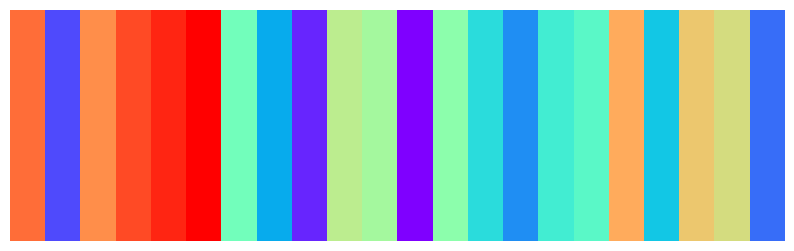

In [62]:
plt.figure(figsize=(10, 3))
plt.imshow(vector, aspect='auto')
plt.axis('off')
plt.savefig('/home/anleg84/Documents/Figures/PaperNetworks2024/figure7_color_vector.svg')

In [67]:
threshold = np.max(number_of_selections_null)
gene_names[np.where(number_of_selections > threshold)[0]]

array(['agrn', 'aldocb', 'crema', 'dlx2a', 'eomesa', 'glyt2', 'grik2',
       'hcn1', 'id2b', 'isl2b', 'mef2cb', 'nkx6.2', 'nxph1', 'onecut1',
       'opn7b', 'pax7a', 'pth2r', 'pyyb', 'r3hdm2', 'slc17a6b', 'sox1b',
       'tac1', 'tac3b', 'tbx2b'], dtype='<U16')

Selection probabilities of genes

In [21]:
significant_gene_names = gene_names[np.where(number_of_selections > threshold)]

In [19]:
selection_probabilities = number_of_selections[np.where(number_of_selections > np.max(number_of_selections_null))]

In [22]:
significant_gene_names[np.flip(np.argsort(selection_probabilities))]

array(['hcn1', 'sox1b', 'crema', 'isl2b', 'opn7b', 'mef2cb', 'tbx2b',
       'nxph1', 'tac3b', 'pyyb', 'neurog1', 'nkx6.2', 'pax7a', 'grik2',
       'glyt2', 'r3hdm2', 'id2b', 'tac1', 'aldocb', 'CABZ01073265.1',
       'pth2r', 'eomesa'], dtype='<U16')

In [24]:
np.flip(np.argsort(selection_probabilities))

array([ 6, 18,  2,  8, 13,  9, 21, 12, 20, 16, 10, 11, 14,  5,  4, 17,  7,
       19,  1,  0, 15,  3])